## Hot Word Detection

Hot word or trigger word detection is the technology that allows devices like Amazon Alexa and Apple Siri to wake up upon hearing a certain word.  

For this exercise, our hot word will be "Activate", since there are pre trained models that save computational power and limitations.     


In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from td_utils import *
%matplotlib inline

# Creating a speech dataset 


In [2]:
IPython.display.Audio("./raw_data/activates/1.wav")

In [3]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [4]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

We will use these three type of recordings (positives/negatives/backgrounds) to create a labelled dataset.

## From audio recordings to spectrograms
We will use audio sampled at 44100 Hz (or 44100 Hertz). Thus, a 10 second audio clip is represented by 441000 numbers (= $10 \times 44100$). 

The spectrogram tells us how much different frequencies are present in an audio clip at a moment in time. 
A spectrogram is computed by sliding a window over the raw audio signal, and calculates the most active frequencies in each window using a Fourier transform. 


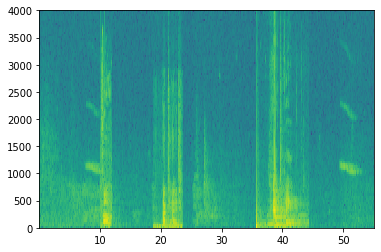

In [5]:
x = graph_spectrogram("audio_examples/example_train.wav")

In [6]:
_, data = wavfile.read("audio_examples/example_train.wav")
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram
Ty = 1375 # The number of time steps in the output of our model

## Generating a single training example

We can synthesize our training data using the audio clips of activates, negatives, and backgrounds. 
To synthesize a single training example:

- Pick a random 10 second background audio clip
- Randomly insert 0-4 audio clips of "activate" into this 10sec clip
- Randomly insert 0-2 audio clips of negative words into this 10sec clip

Because we had synthesized the word "activate" into the background clip, we know exactly when in the 10sec clip the "activate" makes its appearance. 
Pydub uses 1ms as the discretization interval (1ms is 1 millisecond = 1/1000 seconds) which is why a 10sec clip is always represented using 10,000 steps. 

In [7]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio()


**Overlaying positive/negative words on the background**:

We will be inserting multiple clips of positive/negative words onto the background, and we don't want to insert an "activate" or a random word somewhere that overlaps with another clip we had previously added. 

**Creating the labels at the same time we overlay**:

Recall also that the labels $y^{\langle t \rangle}$ represent whether or not someone has just finished saying "activate." Given a background clip, we can initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activates." 

When we insert or overlay an "activate" clip, we will also update labels for $y^{\langle t \rangle}$, so that 50 steps of the output now have target label 1. We will train a GRU to detect when someone has *finished* saying "activate". For example, suppose the synthesized "activate" clip ends at the 5sec mark in the 10sec audio---exactly halfway into the clip. Recall that $T_y = 1375$, so timestep $687 = $ `int(1375*0.5)` corresponds to the moment at 5sec into the audio. So, we will set $y^{\langle 688 \rangle} = 1$. Further, we would quite satisfied if the GRU detects "activate" anywhere within a short time-internal after this moment, so we actually set 50 consecutive values of the label $y^{\langle t \rangle}$ to 1. Specifically, we have $y^{\langle 688 \rangle} = y^{\langle 689 \rangle} = \cdots = y^{\langle 737 \rangle} = 1$.  


In [8]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [9]:
def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    overlap = False

    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True


    return overlap

In [10]:

def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    segment_ms = len(audio_clip)
     
    segment_time = get_random_time_segment(segment_ms)
    
    while is_overlapping(segment_time, previous_segments):
        segment_time = get_random_time_segment(segment_ms)

    previous_segments.append(segment_time)
    new_background = background.overlay(audio_clip, position = segment_time[0])
    
    return new_background, segment_time

In [11]:

def insert_ones(y, segment_end_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 followinf labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[0, i] = 1
    
    return y

In [12]:

def create_training_example(background, activates, negatives):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a 10 second background audio recording
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    np.random.seed(18)
    
    # Make background quieter
    background = background - 20

    y = np.zeros((1, Ty))

    previous_segments = []

    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    # Step 3: Loop over randomly selected "activate" clips and insert in background
    for random_activate in random_activates:
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        segment_start, segment_end = segment_time
        y = insert_ones(y, segment_end_ms=segment_end)

    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    for random_negative in random_negatives:
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    
    background = match_target_amplitude(background, -20.0)

    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in the directory.")
    
    x = graph_spectrogram("train.wav")
    
    return x, y

File (train.wav) was saved in the directory.


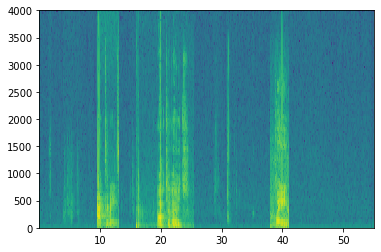

In [13]:
x, y = create_training_example(backgrounds[0], activates, negatives)
X = np.load("./XY_train/X.npy")
Y = np.load("./XY_train/Y.npy")

In [14]:
y.shape

(1, 1375)

Now we can listen to the training example we created and compare it to the spectrogram generated above.

In [15]:
IPython.display.Audio("train.wav")

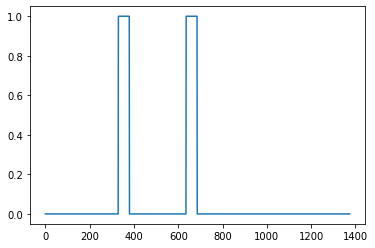

In [16]:
plt.plot(y[0])

## 1.5 - Development set

To test our model, we recorded a development set of 25 examples. While our training data is synthesized, we want to create a development set using the same distribution as the real inputs. Thus, we recorded 25 10-second audio clips of people saying "activate" and other random words, and labeled them by hand. 

In [17]:
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

In [18]:
Y_dev.shape

(25, 1375, 1)

# 2 - Model

Now that we have built a dataset, lets write and train a hot word detection model! 

The model will use 1-D convolutional layers, GRU layers, and dense layers. 

In [19]:
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape,CuDNNLSTM,CuDNNGRU
from keras.optimizers import Adam

Using TensorFlow backend.
/home/mohit/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/mohit/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/mohit/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/mohit/anaconda3/lib/python3.7/site-packages/tensorflo

## 2.1 - Build the model





One key step of this model is the 1D convolutional step (near the bottom of Figure 3). It inputs the 5511 step spectrogram, and outputs a 1375 step output, which is then further processed by multiple layers to get the final $T_y = 1375$ step output.  

Computationally, the 1-D conv layer also helps speed up the model because now the GRU  has to process only 1375 timesteps rather than 5511 timesteps. The two GRU layers read the sequence of inputs from left to right, then ultimately uses a dense+sigmoid layer to make a prediction for $y^{\langle t \rangle}$. Because $y$ is binary valued (0 or 1), we use a sigmoid output at the last layer to estimate the chance of the output being 1, corresponding to the user having just said "activate."
 

In [20]:

def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    
    # Step 1: CONV layer 
    X = Conv1D(196, kernel_size=15, strides=4)(X_input)     # CONV1D
    X = BatchNormalization()(X)                                 # Batch normalization
    X = Activation('relu')(X)                                 # ReLu activation
    X = Dropout(0.8)(X)                                 # dropout (use 0.8)

    # Step 2: First GRU Layer 
    X = GRU(units = 128, return_sequences = True)(X) # GRU (use 128 units and return the sequences)
    X = Dropout(0.6)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                                 # Batch normalization
    
    #Step 3: Second GRU layer
    X = GRU(units = 128, return_sequences = True)(X) # GRU (use 128 units and return the sequences)
    X = Dropout(0.6)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X) 
    
    #Step 4: Third GRU layer
    X = GRU(units = 128, return_sequences = True)(X) # GRU (use 128 units and return the sequences)
    X = Dropout(0.6)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X) 
    
    # Step 3: Fourth GRU Layer 
    X = GRU(units = 128, return_sequences = True)(X)   # GRU (use 128 units and return the sequences)
    X = Dropout(0.6)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                                  # Batch normalization
    X = Dropout(0.6)(X)                                  # dropout (use 0.8)
    
    # Step 4: Time-distributed dense layer 
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) # time distributed  (sigmoid)

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [21]:
model = model(input_shape = (Tx, n_freq))
model.summary()





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_1 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_1 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 196)         0         
_________________________________________________________________
gru_1 (GRU)                  (None, 1375, 128)         124800    
_______________________

**Expected Output**:

<table>
    <tr>
        <td>
            **Total params**
        </td>
        <td>
           522,561
        </td>
    </tr>
    <tr>
        <td>
            **Trainable params**
        </td>
        <td>
           521,657
        </td>
    </tr>
    <tr>
        <td>
            **Non-trainable params**
        </td>
        <td>
           904
        </td>
    </tr>
</table>

## 2.2 - Fit the model

In [22]:
model = load_model('./models/tr_model.h5')



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


/home/mohit/anaconda3/lib/python3.7/site-packages/keras/engine/saving.py:327: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


We train the model further, using the Adam optimizer and binary cross entropy loss, as follows. 

In [23]:
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [24]:
model.fit(X, Y, batch_size = 5, epochs=5)

Epoch 1/5
26/26 [==============================] - 35s 1s/step - loss: 0.0773 - acc: 0.9768
Epoch 2/5
26/26 [==============================] - 30s 1s/step - loss: 0.0510 - acc: 0.9831
Epoch 3/5
26/26 [==============================] - 31s 1s/step - loss: 0.0457 - acc: 0.9848
Epoch 4/5
26/26 [==============================] - 33s 1s/step - loss: 0.0711 - acc: 0.9792
Epoch 5/5
26/26 [==============================] - 30s 1s/step - loss: 0.0530 - acc: 0.9822


## 2.3 - Test the model

Finally, let's see how the model performs on the dev set.

In [25]:
loss, acc = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

25/25 [==============================] - 7s 288ms/step
Dev set accuracy =  0.9311127066612244


# Making Predictions


In [26]:
def detect_hotword(filename):
    plt.subplot(2, 1, 1)

    x = graph_spectrogram(filename)
    # the spectogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

Once we have estimated the probability of having detected the word "activate" at each output step, we can trigger a "chiming" sound to play when the probability is above a certain threshold. Further, $y^{\langle t \rangle}$ might be near 1 for many values in a row after "activate" is said, yet we want to chime only once. So we will insert a chime sound at most once every 75 output steps. This will help prevent us from inserting two chimes for a single instance of "activate".


In [27]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    #  Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    #  Loop over the output steps in the y
    for i in range(Ty):
        #  Increment consecutive output steps
        consecutive_timesteps += 1
        # If prediction is higher than the threshold and more than 75 consecutive output steps have passed
        if predictions[0,i,0] > threshold and consecutive_timesteps > 60:
            # Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            #  Reset consecutive output steps to 0
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

In [28]:
IPython.display.Audio("chime_output.wav")

/home/mohit/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:7739: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


array([[2.38025962e+02, 1.12483327e+02, 4.98363637e+01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.79844178e+02, 6.04731935e+01, 2.59407116e+02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.03889878e+02, 1.66124453e+02, 3.84790267e+02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [6.10607148e-05, 2.12666750e-05, 1.12703886e-06, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [4.98009891e-05, 3.55184532e-05, 4.73754977e-06, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.81723633e-05, 1.59065311e-05, 2.35852962e-05, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

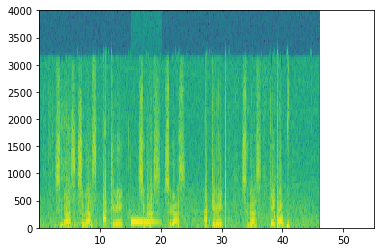

In [29]:
graph_spectrogram("chime_output.wav")

## 3.3 - Test on dev examples

Let's explore how our model performs on two unseen audio clips from the development set. Lets first listen to the two dev set clips. 

In [30]:
IPython.display.Audio("./raw_data/dev/1.wav")

array([[2.73971442e-04, 6.22171197e-03, 1.21047806e-01, ...,
        2.17420077e-03, 5.89887301e-03, 7.45693807e-04],
       [4.60924674e-04, 1.28921419e-03, 1.12560994e-01, ...,
        2.30898542e-02, 3.74101728e-02, 2.33349057e-02],
       [2.48210647e-04, 1.11794117e-03, 3.31068006e-02, ...,
        7.80822576e-03, 1.02039439e-02, 3.17848941e-02],
       ...,
       [1.36669644e-06, 2.29373040e-06, 3.92809210e-06, ...,
        4.23582655e-05, 1.47224941e-05, 5.71301887e-06],
       [6.37510916e-07, 5.79514088e-07, 1.20510555e-05, ...,
        4.83520394e-05, 2.04712360e-05, 4.93234585e-05],
       [2.53217152e-07, 3.10772172e-07, 2.51056351e-06, ...,
        1.82498363e-05, 7.30106127e-06, 4.69912826e-05]])

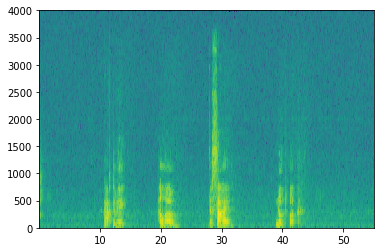

In [31]:
graph_spectrogram("./raw_data/dev/1.wav")

array([[1.92376123e+00, 1.08330002e-02, 1.05092788e+02, ...,
        9.24934704e+01, 3.95603478e+01, 1.43213587e+02],
       [1.08146852e+01, 2.39370411e+01, 1.05798377e+02, ...,
        1.64275806e+02, 1.12150295e+02, 1.92155002e+02],
       [1.26562258e+00, 1.41155005e+01, 2.30935911e+01, ...,
        4.27016624e+01, 8.67283105e+00, 4.97418697e+01],
       ...,
       [3.69693603e-03, 7.69111845e-03, 7.89083212e-03, ...,
        2.77175522e-04, 2.69753558e-02, 5.74939319e-03],
       [1.34093974e-02, 3.01282529e-03, 1.27505575e-02, ...,
        3.79751605e-03, 1.46809131e-02, 3.20937912e-03],
       [1.26680670e-02, 1.67146853e-04, 3.62024092e-03, ...,
        2.41261788e-03, 6.04276870e-04, 7.32357635e-03]])

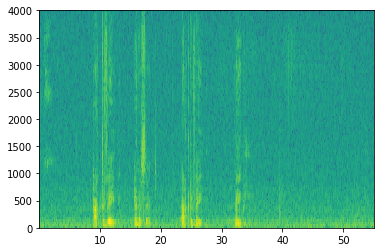

In [32]:
graph_spectrogram("./raw_data/dev/2.wav")

Now lets run the model on these audio clips and see if it adds a chime after "activate"!

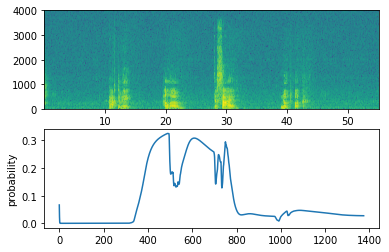

In [33]:
filename = "./raw_data/dev/1.wav"
prediction = detect_hotword(filename)
chime_on_activate(filename, prediction, 0.6)
IPython.display.Audio("./chime_output.wav")

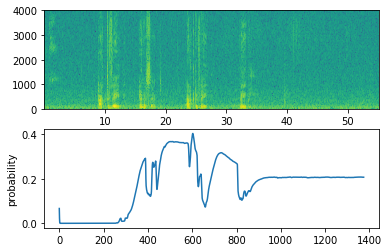

In [34]:
filename  = "./raw_data/dev/2.wav"
prediction = detect_hotword(filename)
chime_on_activate(filename, prediction, 0.6)
IPython.display.Audio("./chime_output.wav")

# 4 - Try our own example!

Record a 10 second audio clip saying the word "activate" and other random words, and upload it as `myaudio.wav`. Be sure to upload the audio as a wav file.


In [35]:
# Preprocess the audio to the correct format
def preprocess_audio(filename):
    # Trim or pad audio segment to 10000ms
    padding = AudioSegment.silent(duration=10000)
    segment = AudioSegment.from_wav(filename)[:10000]
    segment = padding.overlay(segment)
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

Once we've uploaded our audio file, put the path to the file in the variable below.

In [36]:
our_filename = "audio_examples/my_audio.wav"

In [37]:
preprocess_audio(our_filename)
IPython.display.Audio(our_filename) # listen to the audio  uploaded 

Finally, use the model to predict when we say activate in the 10 second audio clip, and trigger a chime. If beeps are not being added appropriately, try to adjust the chime_threshold.

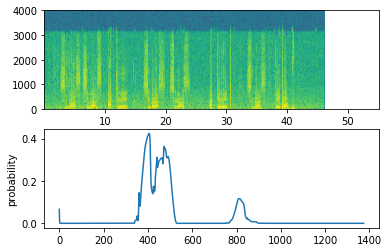

In [39]:
chime_threshold = 0.3
prediction = detect_hotword(our_filename)
chime_on_activate(our_filename, prediction, chime_threshold)
IPython.display.Audio("./chime_output.wav")